In [1]:
!pip install numpy pandas tqdm celluloid scikit-learn
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121


In [2]:
!git clone https://github.com/tanelp/tiny-diffusion.git

Cloning into 'tiny-diffusion'...
remote: Enumerating objects: 32, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 32 (delta 5), reused 3 (delta 2), pack-reused 19 (from 1)
Receiving objects: 100% (32/32), 11.38 MiB | 13.40 MiB/s, done.
Resolving deltas: 100% (6/6), done.


In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
%cd /content/tiny-diffusion

/content/tiny-diffusion


In [5]:
import math

import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.auto import tqdm

import ddpm
import datasets

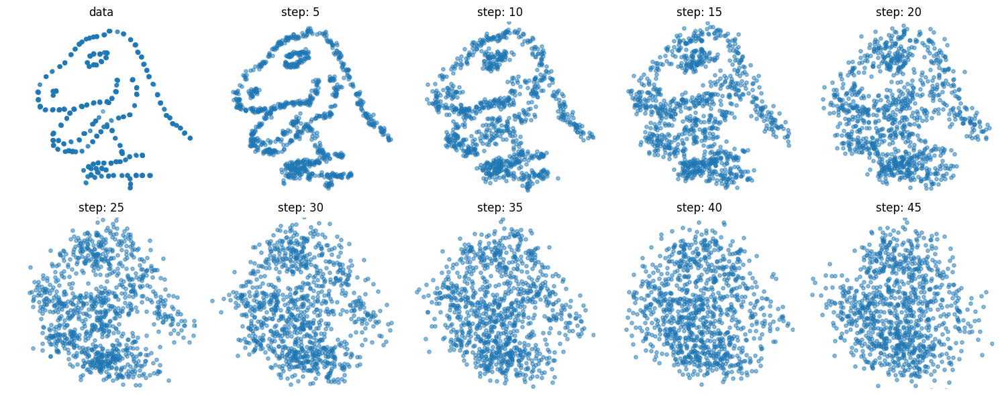

In [6]:
# forward diffusion process

num_timesteps = 50
plot_step = 5

num_plots = math.ceil(num_timesteps / plot_step)
num_cols = 5
num_rows = math.ceil(num_plots / num_cols)

fig = plt.figure(figsize=(15, 6))

noise_scheduler = ddpm.NoiseScheduler(num_timesteps=num_timesteps)
dataset = datasets.get_dataset("dino", n=1000)
x0 = dataset.tensors[0]

plt_cnt = 1
plt.subplot(num_rows, num_cols, plt_cnt)
plt.scatter(x0[:, 0], x0[:, 1], alpha=0.5, s=15)
plt.title("data")
plt.xlim(-3.5, 3.5)
plt.ylim(-4., 4.75)
plt.axis("off")

for t in range(len(noise_scheduler)):
    timesteps = np.repeat(t, len(x0))
    noise = torch.randn_like(x0)
    sample = noise_scheduler.add_noise(x0, noise, timesteps)
    if (t + 1) % plot_step == 0 and (t + 1) != len(noise_scheduler):
        plt_cnt += 1
        plt.subplot(num_rows, num_cols, plt_cnt)
        plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15)
        plt.title(f"step: {t + 1}")
        plt.xlim(-3.5, 3.5)
        plt.ylim(-4., 4.75)
        plt.axis("off")

fig.tight_layout()
plt.savefig("static/forward.png", facecolor="white")
plt.show()

In [7]:
# training the diffusion model for 200 epochs
!python ddpm.py --experiment_name dino_base

Training model...
Epoch 0: 100% 250/250 [00:01<00:00, 143.97it/s, loss=1, step=249]
100% 50/50 [00:00<00:00, 151.94it/s]
Epoch 1: 100% 250/250 [00:01<00:00, 189.53it/s, loss=1, step=499]
100% 50/50 [00:00<00:00, 145.22it/s]
Epoch 2: 100% 250/250 [00:01<00:00, 176.19it/s, loss=0.842, step=749]
100% 50/50 [00:00<00:00, 143.74it/s]
Epoch 3: 100% 250/250 [00:01<00:00, 183.83it/s, loss=1.06, step=999]
100% 50/50 [00:00<00:00, 147.39it/s]
Epoch 4: 100% 250/250 [00:01<00:00, 171.77it/s, loss=0.696, step=1249]
100% 50/50 [00:00<00:00, 152.11it/s]
Epoch 5: 100% 250/250 [00:01<00:00, 186.82it/s, loss=0.551, step=1499]
100% 50/50 [00:00<00:00, 237.00it/s]
Epoch 6: 100% 250/250 [00:01<00:00, 174.81it/s, loss=0.976, step=1749]
100% 50/50 [00:00<00:00, 152.95it/s]
Epoch 7: 100% 250/250 [00:01<00:00, 160.34it/s, loss=0.647, step=1999]
100% 50/50 [00:00<00:00, 143.06it/s]
Epoch 8: 100% 250/250 [00:01<00:00, 165.74it/s, loss=0.85, step=2249]
100% 50/50 [00:00<00:00, 142.85it/s]
Epoch 9: 100% 250/250 [0

In [8]:
# set up the model for evaluation

model = ddpm.MLP()

path = "exps/dino_base/model.pth"
model.load_state_dict(torch.load(path))
model.eval()

<ipython-input-8-c757ff69bc35>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


MLP(
  (time_mlp): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (input_mlp1): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (input_mlp2): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (joint_mlp): Sequential(
    (0): Linear(in_features=384, out_features=128, bias=True)
    (1): GELU(approximate='none')
    (2): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (3): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (4): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (5): Linear(in_features=128, out_features=2, bias=True)
  )
)

In [9]:
# evaluation of the trained model

eval_batch_size = 1000
num_timesteps = 50
plot_step = 5
noise_scheduler = ddpm.NoiseScheduler(num_timesteps=num_timesteps)
sample = torch.randn(eval_batch_size, 2)
timesteps = list(range(num_timesteps))[::-1]
samples = []
steps = []
for i, t in enumerate(tqdm(timesteps)):
    t = torch.from_numpy(np.repeat(t, eval_batch_size)).long()
    with torch.no_grad():
        residual = model(sample, t)
    sample = noise_scheduler.step(residual, t[0], sample)
    if (i + 1) % plot_step == 0:
        samples.append(sample.numpy())
        steps.append(i + 1)

  0%|          | 0/50 [00:00<?, ?it/s]

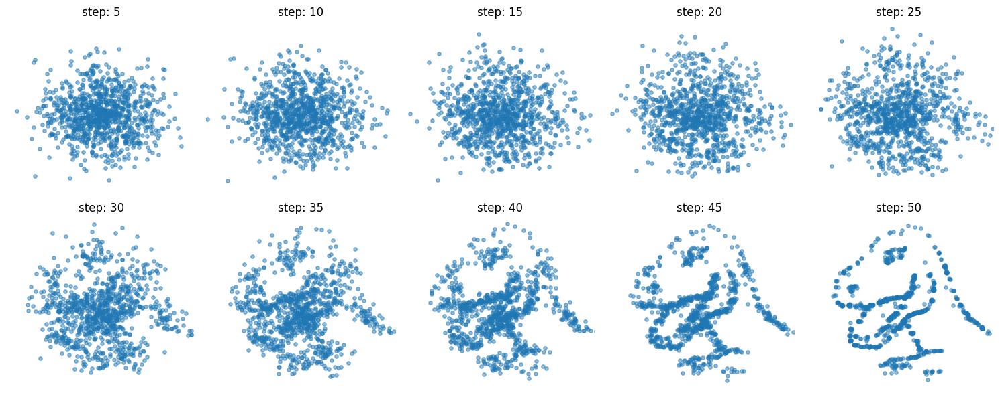

In [10]:
# show reverse diffusion process

num_cols = 5
num_rows = math.ceil(len(samples) / num_cols)
fig = plt.figure(figsize=(15, 6))
for i, sample in enumerate(samples):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15)
    plt.title(f"step: {steps[i]}")
    plt.xlim(-3.5, 3.5)
    plt.ylim(-4., 4.75)
    plt.axis("off")
fig.tight_layout()
plt.savefig("static/reverse.png", facecolor="white")
plt.show()

In [11]:
# plot to compare different settings (e.g. different hyperparameters, datasets, etc.)

def plot_ablation(frames_dict, outname):
    num_rows = len(frames_dict)
    num_cols = 10

    fig = plt.figure(figsize=(3.5*num_cols, 3*num_rows + 0.5))
    row = 0

    for name, frames in frames_dict.items():
        epoch_step = len(frames) // num_cols
        offset = row*(num_cols + 1)
        plt.subplot(num_rows, num_cols + 1, offset + 1)
        plt.scatter(0, 0, alpha=0)
        plt.text(0, 0, name, fontdict={"size": 30})
        plt.xlim(-0.25, 2)
        plt.axis("off")

        for i in range(num_cols):
            plt.subplot(num_rows, num_cols + 1, offset + i + 2)
            ix = i * epoch_step
            frame = frames[ix]
            plt.scatter(frame[:, 0], frame[:, 1], s=5, alpha=0.7)
            if row == 0:
                if i == 0:
                    title = f"epoch {ix}"
                else:
                    title = f"{ix}"
                plt.title(title, fontdict={"size": 30}, pad=30)
            plt.xlim(-3.5, 3.5)
            plt.ylim(-4., 4.75)
            plt.axis("off")

        row += 1

    plt.tight_layout()
    plt.savefig(outname, facecolor="white")
    plt.show()

In [12]:
# compare different learning rates
!python ddpm.py --learning_rate 1e-2 --experiment_name dino_lr1e-2
!python ddpm.py --learning_rate 1e-3 --experiment_name dino_lr1e-3
!python ddpm.py --learning_rate 1e-4 --experiment_name dino_lr1e-4
!python ddpm.py --learning_rate 1e-5 --experiment_name dino_lr1e-5

Training model...
Epoch 0: 100% 250/250 [00:00<00:00, 257.30it/s, loss=0.968, step=249]
100% 50/50 [00:00<00:00, 223.28it/s]
Epoch 1: 100% 250/250 [00:01<00:00, 220.86it/s, loss=0.892, step=499]
100% 50/50 [00:00<00:00, 151.56it/s]
Epoch 2: 100% 250/250 [00:01<00:00, 180.71it/s, loss=1.32, step=749]
100% 50/50 [00:00<00:00, 139.73it/s]
Epoch 3: 100% 250/250 [00:01<00:00, 174.38it/s, loss=0.938, step=999]
100% 50/50 [00:00<00:00, 182.96it/s]
Epoch 4: 100% 250/250 [00:00<00:00, 260.79it/s, loss=0.918, step=1249]
100% 50/50 [00:00<00:00, 229.51it/s]
Epoch 5: 100% 250/250 [00:00<00:00, 250.90it/s, loss=1.45, step=1499]
100% 50/50 [00:00<00:00, 219.82it/s]
Epoch 6: 100% 250/250 [00:00<00:00, 252.81it/s, loss=0.968, step=1749]
100% 50/50 [00:00<00:00, 225.98it/s]
Epoch 7: 100% 250/250 [00:00<00:00, 253.19it/s, loss=0.882, step=1999]
100% 50/50 [00:00<00:00, 223.59it/s]
Epoch 8: 100% 250/250 [00:00<00:00, 250.08it/s, loss=0.951, step=2249]
100% 50/50 [00:00<00:00, 219.71it/s]
Epoch 9: 100% 25

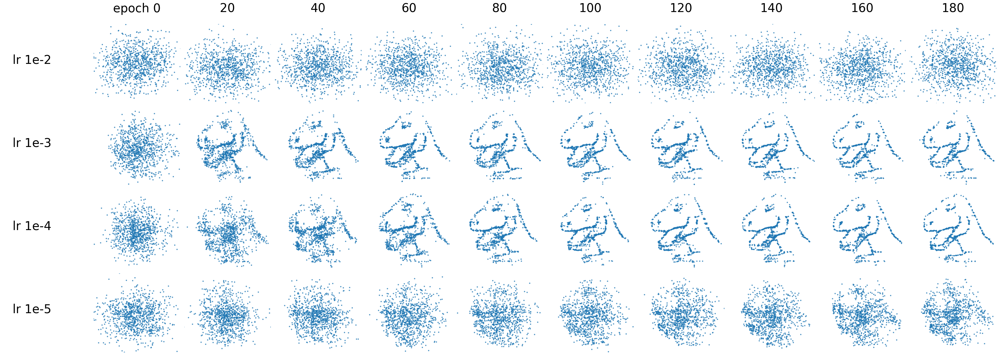

In [13]:
# compare different learning rates

frames_dict = {
    "lr 1e-2": np.load("exps/dino_lr1e-2/frames.npy"),
    "lr 1e-3": np.load("exps/dino_lr1e-3/frames.npy"),
    "lr 1e-4": np.load("exps/dino_lr1e-4/frames.npy"),
    "lr 1e-5": np.load("exps/dino_lr1e-5/frames.npy"),
}

plot_ablation(frames_dict, "static/learning_rate.png")

In [14]:
# comparison of different timestep sizes
!python ddpm.py --num_timesteps 5 --experiment_name dino_timesteps5
!python ddpm.py --num_timesteps 10 --experiment_name dino_timesteps10
!python ddpm.py --num_timesteps 25 --experiment_name dino_timesteps25
!python ddpm.py --num_timesteps 50 --experiment_name dino_timesteps50
!python ddpm.py --num_timesteps 100 --experiment_name dino_timesteps100
!python ddpm.py --num_timesteps 250 --experiment_name dino_timesteps250

Training model...
Epoch 0: 100% 250/250 [00:01<00:00, 240.86it/s, loss=1.14, step=249]
100% 5/5 [00:00<00:00, 103.23it/s]
Epoch 1: 100% 250/250 [00:01<00:00, 211.75it/s, loss=1.04, step=499]
100% 5/5 [00:00<00:00, 98.72it/s]
Epoch 2: 100% 250/250 [00:01<00:00, 160.95it/s, loss=0.867, step=749]
100% 5/5 [00:00<00:00, 89.83it/s]
Epoch 3: 100% 250/250 [00:01<00:00, 191.01it/s, loss=0.933, step=999]
100% 5/5 [00:00<00:00, 123.24it/s]
Epoch 4: 100% 250/250 [00:00<00:00, 273.28it/s, loss=0.987, step=1249]
100% 5/5 [00:00<00:00, 171.06it/s]
Epoch 5: 100% 250/250 [00:00<00:00, 272.21it/s, loss=1.24, step=1499]
100% 5/5 [00:00<00:00, 140.41it/s]
Epoch 6: 100% 250/250 [00:00<00:00, 259.06it/s, loss=0.899, step=1749]
100% 5/5 [00:00<00:00, 146.44it/s]
Epoch 7: 100% 250/250 [00:01<00:00, 242.88it/s, loss=1.14, step=1999]
100% 5/5 [00:00<00:00, 120.26it/s]
Epoch 8: 100% 250/250 [00:01<00:00, 244.43it/s, loss=0.58, step=2249]
100% 5/5 [00:00<00:00, 149.14it/s]
Epoch 9: 100% 250/250 [00:01<00:00, 235

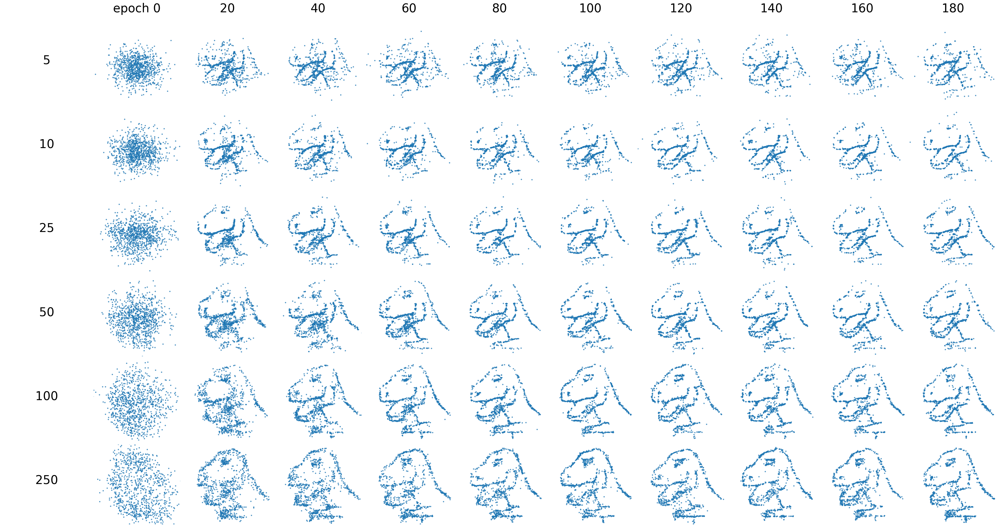

In [15]:
# comparison of different timestep sizes

frames_dict = {
    "        5": np.load("exps/dino_timesteps5/frames.npy"),
    "       10": np.load("exps/dino_timesteps10/frames.npy"),
    "       25": np.load("exps/dino_timesteps25/frames.npy"),
    "       50": np.load("exps/dino_timesteps50/frames.npy"),
    "      100": np.load("exps/dino_timesteps100/frames.npy"),
    "      250": np.load("exps/dino_timesteps250/frames.npy"),
}

plot_ablation(frames_dict, "static/num_timesteps.png")

<ipython-input-16-f83c4f08bbe0>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path))


  0%|          | 0/250 [00:00<?, ?it/s]

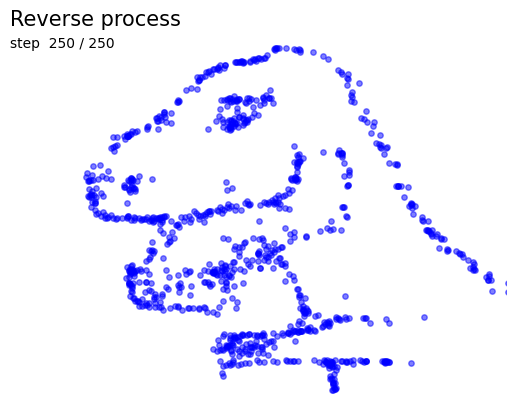

In [16]:
# creates an animation of the entire diffusion process

from celluloid import Camera

num_timesteps = 250
noise_scheduler = ddpm.NoiseScheduler(num_timesteps=num_timesteps)

model = ddpm.MLP()
path = "exps/dino_timesteps250/model.pth"
model.load_state_dict(torch.load(path))
model.eval()

dataset = datasets.get_dataset("dino", n=1000)
x0 = dataset.tensors[0]

forward_samples = []
forward_samples.append(x0)
for t in range(len(noise_scheduler)):
    timesteps = np.repeat(t, len(x0))
    noise = torch.randn_like(x0)
    sample = noise_scheduler.add_noise(x0, noise, timesteps)
    forward_samples.append(sample)

eval_batch_size = len(dataset)
sample = torch.randn(eval_batch_size, 2)
timesteps = list(range(num_timesteps))[::-1]
reverse_samples = []
reverse_samples.append(sample.numpy())
for i, t in enumerate(tqdm(timesteps)):
    t = torch.from_numpy(np.repeat(t, eval_batch_size)).long()
    with torch.no_grad():
        residual = model(sample, t)
    sample = noise_scheduler.step(residual, t[0], sample)
    reverse_samples.append(sample.numpy())

xmin, xmax = -3.5, 3.5
ymin, ymax = -4., 4.75

fig, ax = plt.subplots()
camera = Camera(fig)

# forward
for i, sample in enumerate(forward_samples):
    plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15, color="blue")
    ax.text(0.0, 0.95, f"step {i: 4} / {num_timesteps}", transform=ax.transAxes)
    ax.text(0.0, 1.01, "Forward process", transform=ax.transAxes, size=15)
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    plt.axis("off")
    camera.snap()

# reverse
for i, sample in enumerate(reverse_samples):
    plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15, color="blue")
    ax.text(0.0, 0.95, f"step {i: 4} / {num_timesteps}", transform=ax.transAxes)
    ax.text(0.0, 1.01, "Reverse process", transform=ax.transAxes, size=15)
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    plt.axis("off")
    camera.snap()

animation = camera.animate(blit=True, interval=35)
animation.save("static/animation.mp4")

In [18]:
from IPython.display import Video
Video('static/animation.mp4', embed=True)